In [1]:
%pip install networkx matplotlib


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


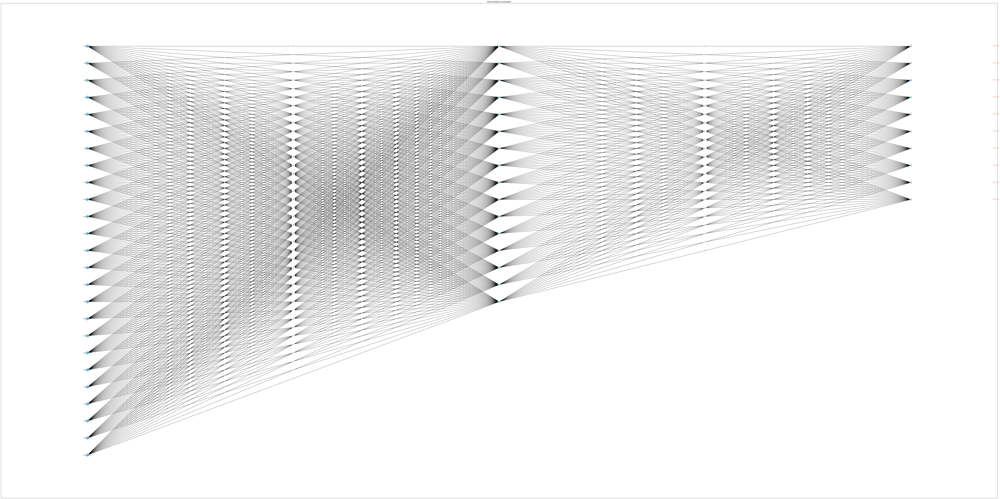

In [19]:
import networkx as nx
import matplotlib.pyplot as plt
import random

def visualize_neural_network(input_size, hidden_size, output_size, filename='neural_network.png'):
    G = nx.DiGraph()

    # Define layers
    layers = [input_size, hidden_size, output_size]
    layer_labels = ['Input Layer', 'Hidden Layer', 'Output Layer']
    pos = {}  # positions for all nodes
    node_sizes = []  # sizes for all nodes
    labels = {}  # labels for all nodes

    # Add nodes
    node_id = 0
    x_offset = 0
    y_offsets = {i: 0 for i in range(len(layers))}
    for layer_idx, layer_size in enumerate(layers):
        for neuron_idx in range(layer_size):
            G.add_node(node_id, layer=layer_idx)
            pos[node_id] = (x_offset, y_offsets[layer_idx])
            node_sizes.append(500 if layer_idx == 0 else 200)
            labels[node_id] = f"{layer_labels[layer_idx]} {neuron_idx+1}" if layer_idx == 0 else ""
            y_offsets[layer_idx] -= 1
            node_id += 1
        x_offset += 1

    # Add edges with random weights and biases
    edges = []
    for i in range(input_size):
        for j in range(input_size, input_size + hidden_size):
            weight = round(random.uniform(-1, 1), 2)
            edges.append((i, j, weight))

    for i in range(input_size, input_size + hidden_size):
        for j in range(input_size + hidden_size, input_size + hidden_size + output_size):
            weight = round(random.uniform(-1, 1), 2)
            edges.append((i, j, weight))

    G.add_weighted_edges_from(edges)

    # Set the figure size for better visibility
    plt.figure(figsize=(128, 64))

    # Draw the nodes
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue')

    # Draw the edges with weights
    edge_labels = {(u, v): f'{d["weight"]}' for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edges(G, pos, arrowstyle='-|>', arrowsize=10)
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7)

    # Draw the labels
    nx.draw_networkx_labels(G, pos, labels, font_size=8)

    # Draw biases as labels on the nodes in the hidden and output layers
    bias_offsets = {i: 0 for i in range(input_size + hidden_size, input_size + hidden_size + output_size)}
    for layer_start in [input_size, input_size + hidden_size]:
        for i in range(layer_start, layer_start + layers[layer_start // input_size]):
            bias = round(random.uniform(-1, 1), 2)
            if i not in bias_offsets:
                continue
            plt.text(pos[i][0] + 0.2, pos[i][1] + bias_offsets[i], f'bias: {bias}', color='red', fontsize=8)
            bias_offsets[i] -= 0.1

    plt.title('Neural Network Visualization')

    # Save the figure as a high-resolution PNG
    plt.savefig(filename, format='png', dpi=300)
    plt.show()

# Visualize the neural network with 25 input neurons, 16 hidden neurons, and 10 output neurons
visualize_neural_network(25, 16, 10)


In [16]:
%pip install graphviz

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [18]:
import graphviz
import random

def visualize_neural_network(input_size, hidden_size, output_size, filename='neural_network_graphviz'):
    dot = graphviz.Digraph(format='png')

    # Add input layer nodes
    for i in range(input_size):
        dot.node(f'in_{i}', label=f'Input {i+1}', shape='circle')

    # Add hidden layer nodes
    for i in range(hidden_size):
        dot.node(f'hidden_{i}', label=f'Hidden {i+1}', shape='circle')

    # Add output layer nodes
    for i in range(output_size):
        dot.node(f'out_{i}', label=f'Output {i+1}', shape='circle')

    # Add edges with random weights
    for i in range(input_size):
        for j in range(hidden_size):
            weight = round(random.uniform(-1, 1), 2)
            dot.edge(f'in_{i}', f'hidden_{j}', label=f'{weight}')

    for i in range(hidden_size):
        for j in range(output_size):
            weight = round(random.uniform(-1, 1), 2)
            dot.edge(f'hidden_{i}', f'out_{j}', label=f'{weight}')

    # Save the figure as a high-resolution PNG
    dot.render(filename, view=True)

# Visualize the neural network with 49 input neurons, 16 hidden neurons, and 10 output neurons
visualize_neural_network(25, 16, 10)


In [20]:
%pip install tensorflow tensorboard


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import TensorBoard
import numpy as np

def create_model(input_size, hidden_size, output_size):
    model = Sequential()
    model.add(Dense(hidden_size, input_dim=input_size, activation='relu', name='Hidden_Layer'))
    model.add(Dense(output_size, activation='softmax', name='Output_Layer'))
    return model

# Create a model with 49 input neurons, 16 hidden neurons, and 10 output neurons
input_size = 49
hidden_size = 16
output_size = 10
model = create_model(input_size, hidden_size, output_size)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy')

# Generate random data to simulate training
x_train = np.random.random((100, input_size))
y_train = tf.keras.utils.to_categorical(np.random.randint(output_size, size=(100, 1)), num_classes=output_size)

# Set up TensorBoard callback
tensorboard_callback = TensorBoard(log_dir="./logs", histogram_freq=1)

# Train the model
model.fit(x_train, y_train, epochs=1, callbacks=[tensorboard_callback])

# Launch TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs

/Users/mab/Library/Python/3.9/lib/python/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.3965  


In [23]:
%pip install ann_visualizer


Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for ann_visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4168 sha256=0dc3ea2d8845dbbf5c99cb235c3dd9dd79a96ae06cf5d4df466eb70ae2fdd2df
  Stored in directory: /Users/mab/Library/Caches/pip/wheels/2d/d8/86/67f4a249969eaaa31c6df569f4ebfa84634fae3af2c627107b
Successfully built ann_visualizer
Note: you may need to restart the kernel to use updated packages.


In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from ann_visualizer.visualize import ann_viz

In [2]:
def create_model(input_size, hidden_size, output_size):
    # Define the model
    model = Sequential()
    model.add(Dense(input_size, input_dim=input_size, activation='relu', name='Input_Layer'))
    model.add(Dense(hidden_size, activation='relu', name='Hidden_Layer'))
    model.add(Dense(output_size, activation='softmax', name='Output_Layer'))
    return model

In [5]:
# Create a model with 49 input neurons, 16 hidden neurons, and 10 output neurons
input_size = 7
hidden_size = 4
output_size = 2
model = create_model(input_size, hidden_size, output_size)
model.summary()
model.save('model.h5')


/Users/mab/Library/Python/3.9/lib/python/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (Dense)             │ (None, 7)              │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Hidden_Layer (Dense)            │ (None, 4)              │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output_Layer (Dense)            │ (None, 2)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 98 (392.00 B)

 Trainable params: 98 (392.00 B)

 Non-trainable params: 0 (0.00 B)

In [6]:
import netron
# Visualize the model using Netron
netron.start('model.h5')

Serving 'model.h5' at http://localhost:8080


('localhost', 8080)

In [49]:
%pip install pydot

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


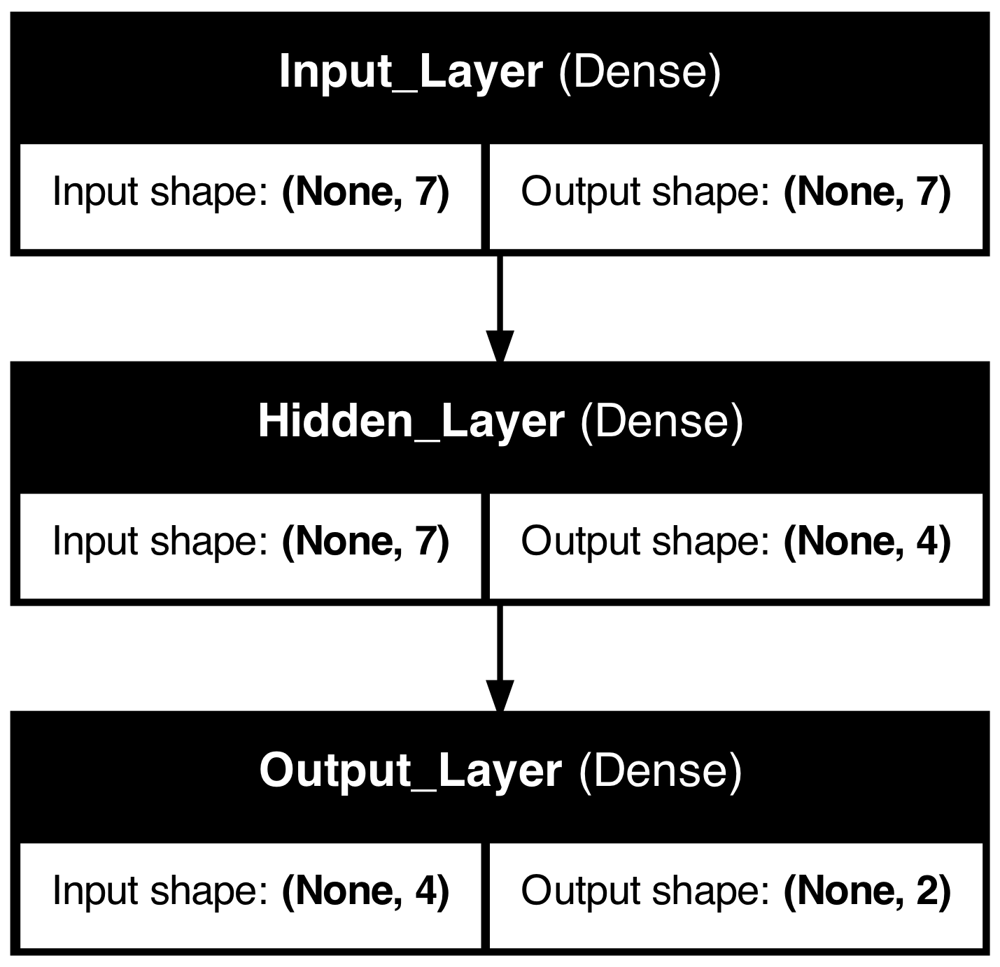

In [8]:
import tensorflow as tf
tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_layer_names=True, rankdir='TB', dpi=300,
    show_shapes=True
)

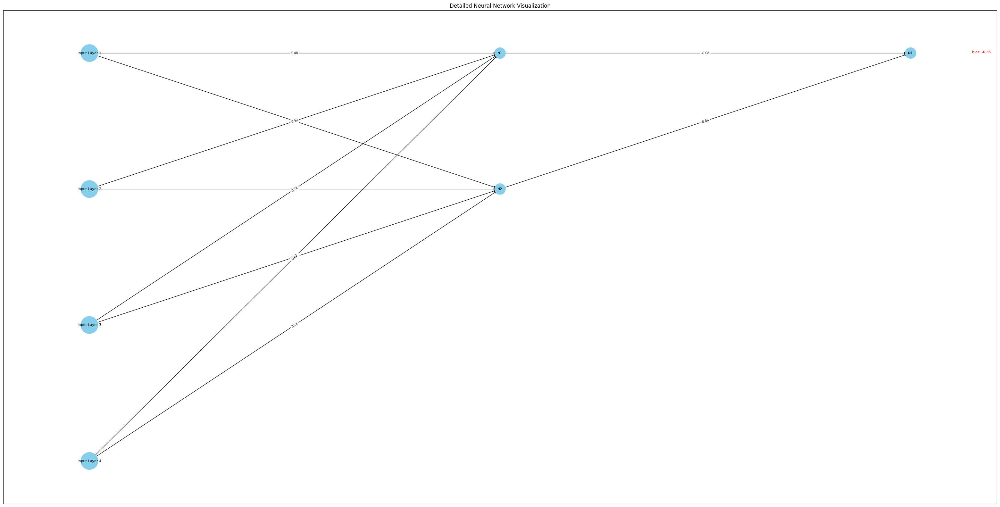

In [13]:
import matplotlib.pyplot as plt
import networkx as nx
import random

def visualize_detailed_neural_network(input_size, hidden_size, output_size, filename='neural_network_detailed.png'):
    G = nx.DiGraph()

    # Define layers
    layers = [input_size, hidden_size, output_size]
    layer_labels = ['Input Layer', 'Hidden Layer', 'Output Layer']
    pos = {}  # positions for all nodes
    node_sizes = []  # sizes for all nodes
    labels = {}  # labels for all nodes

    # Add nodes
    node_id = 0
    x_offset = 0
    y_offsets = {i: 0 for i in range(len(layers))}
    for layer_idx, layer_size in enumerate(layers):
        for neuron_idx in range(layer_size):
            G.add_node(node_id, layer=layer_idx)
            pos[node_id] = (x_offset, y_offsets[layer_idx])
            node_sizes.append(1500 if layer_idx == 0 else 600)
            labels[node_id] = f"{layer_labels[layer_idx]} {neuron_idx+1}" if layer_idx == 0 else f"N{neuron_idx+1}"
            y_offsets[layer_idx] -= 1
            node_id += 1
        x_offset += 2  # Increase the horizontal space between layers

    # Add edges with random weights
    edges = []
    for i in range(input_size):
        for j in range(input_size, input_size + hidden_size):
            weight = round(random.uniform(-1, 1), 2)
            edges.append((i, j, weight))

    for i in range(input_size, input_size + hidden_size):
        for j in range(input_size + hidden_size, input_size + hidden_size + output_size):
            weight = round(random.uniform(-1, 1), 2)
            edges.append((i, j, weight))

    G.add_weighted_edges_from(edges)

    # Set the figure size for better visibility
    plt.figure(figsize=(40, 20))

    # Draw the nodes
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue')

    # Draw the edges with weights
    edge_labels = {(u, v): f'{d["weight"]}' for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edges(G, pos, arrowstyle='-|>', arrowsize=10)
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7)

    # Draw the labels
    nx.draw_networkx_labels(G, pos, labels, font_size=8)

    # Draw biases as labels on the nodes in the hidden and output layers
    bias_offsets = {i: 0 for i in range(input_size + hidden_size, input_size + hidden_size + output_size)}
    for layer_start in [input_size, input_size + hidden_size]:
        for i in range(layer_start, layer_start + layers[layer_start // input_size]):
            bias = round(random.uniform(-1, 1), 2)
            if i not in bias_offsets:
                continue
            plt.text(pos[i][0] + 0.3, pos[i][1] + bias_offsets[i], f'bias: {bias}', color='red', fontsize=8)
            bias_offsets[i] -= 0.1

    plt.title('Detailed Neural Network Visualization')

    # Save the figure as a high-resolution PNG
    plt.savefig(filename, format='png', dpi=300)
    plt.show()

# Visualize the neural network with 49 input neurons, 16 hidden neurons, and 10 output neurons
visualize_detailed_neural_network(4, 2, 1)


In [9]:
%pip install eiffel2

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [10]:
from eiffel2 import builder
builder([1, 10, 10, 5, 5, 2, 1])
# or the following if you want to have a dark theme

2024-06-23 12:51:29.354 Python[74986:4901628] WARNING: Secure coding is automatically enabled for restorable state! However, not on all supported macOS versions of this application. Opt-in to secure coding explicitly by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState:.
